# Generate cropped database from original one

This code takes images from whole images database and do a crop and regroup images by day on numpy files.


End user can just read this code to see how orientation calibration is done, but it wiil not really help to use the final database.

Input : "ManipeResultats" folder with heavy, big 64 bits images sorted by acquisition, (not simple to use)

Output : Images cropped and reduced to 16 bits (12 bits effective), sorted by date in "YYYY-MM-DD_raw.npy" numpy files with timestamp, and exposure time (microseconds) and "image type" (defined as auto exposure time if < 5, and fixed exposure time if > 5).


In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
@author: leo
"""

import os, sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from tqdm import trange
import skimage.io
import skimage.filters
#import cv2
import time
from scipy.spatial.transform import Rotation as R
from tqdm import tqdm
from p_tqdm import p_map

import centroide_images
import ephemeride

### Choose max angle to be cropped with limit_Zenith_Angle and folders paths

In [2]:
limit_Zenith_Angle=np.pi*0.5
degrees=np.pi/180
path= "/scratch/lpoughon/ManipeResultats/" # Input Path
out_path="/scratch/lpoughon/PolarizedDatabase/" # Output Path
calib_path="/scratch/lpoughon/PolarizedDatabase/calib/" # Calibration Values Path

In [3]:
def cart2sph2(x,y,z):
    """
    Input: Three NumPy arrays with the n coordinates along the x, y, and z axes of n vectors.
    Output: Two NumPy arrays with the n coordinates in azimuth and zenith angle, in radians, 
    using the convention that zenith_angle is pi/2 if the vector lies in the x-y plane and zero 
    along the z-axis.
    """
    azimuth = np.arctan2(y,x)
    zenith_angle = np.pi/2-np.arctan2(z,np.sqrt(x**2 + y**2))
    return azimuth, zenith_angle


def sph2cart2(azimuth,zenith_angle):
    """
    Input: Two NumPy arrays with n coordinates in azimuth and zenith angle, in radians, with the convention 
    that zenith_angle is pi/2 if the vector lies in the x-y plane and zero along the z-axis.
    Output: Three NumPy arrays with the n coordinates along the x, y, and z axes of n vectors.
    """
    x = np.cos(np.pi/2-zenith_angle) * np.cos(azimuth)
    y = np.cos(np.pi/2-zenith_angle) * np.sin(azimuth)
    z = np.sin(np.pi/2-zenith_angle)
    return x, y, z

#def average_angle(angle1,angle2):
#    x=np.cos(angle1)+np.cos(angle2)
#    y=np.sin(angle1)+np.sin(angle2)
#    return np.arctan2(y,x)

def rebin(arr, new_shape): #https://scipython.com/blog/binning-a-2d-array-in-numpy/
    shape = (new_shape[0], arr.shape[0] // new_shape[0],
             new_shape[1], arr.shape[1] // new_shape[1])
    return arr.reshape(shape).mean(-1).mean(1)

In [4]:
dirs = os.listdir(path) # Listing files in the specified path
dirs_files=[]
for file in dirs:
    if file[-4:]=='.npy': # Keeping only those with the extension ".npy". 
        # Normally, they are used to store the absolute path where images are stored.
        dirs_files.append(file)
dirs_files.sort() # Sorting the files in alphabetical order. Since the format is YYYY-MM-DDTHH-mm-ss.npy,
#the files are sorted in chronological order.


In [5]:
orientation_ENU=np.load(calib_path+'orientation_pixels_ENU.npy')
rot_mat=np.load(calib_path+'rot_mat.npy')

### Determine crop zone. It is possible to adjust slightly the cropped area to have a square image.

Crop value detected by zeith angle limit 
crop_x_min,crop_x_max,crop_y_min,crop_y_max 195 1827 408 2040
crop_x_min-crop_x_max,crop_y_min-crop_y_max -1632 -1632
Crop value after whole macropixel correction
crop_x_min,crop_x_max,crop_y_min,crop_y_max 192 1828 408 2044
crop_x_min-crop_x_max,crop_y_min-crop_y_max -1636 -1636
/media/leo/023522FB7C52160B/ManipeResultats/2022-07-31T15-40-32/


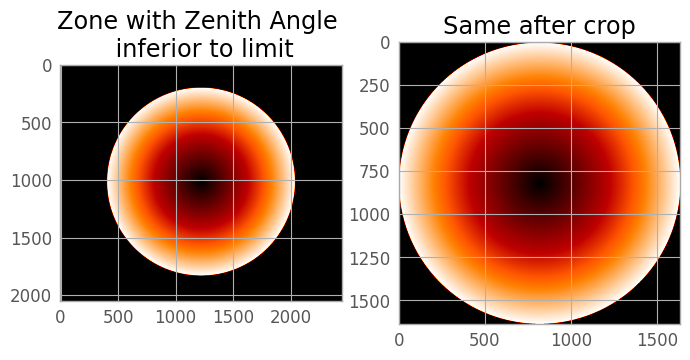

In [6]:
theta_big=orientation_ENU[:,:,1]
alpha_big=orientation_ENU[:,:,0]
thetab=theta_big.copy()
thetab[theta_big>limit_Zenith_Angle]=0

#limite_angle=0.45
crop_x_min=np.nonzero(thetab[:,:])[0].min()
crop_x_max=np.nonzero(thetab[:,:])[0].max()
crop_y_min=np.nonzero(thetab[:,:])[1].min()
crop_y_max=np.nonzero(thetab[:,:])[1].max()

print("Crop value detected by zeith angle limit ")
print("crop_x_min,crop_x_max,crop_y_min,crop_y_max",crop_x_min,crop_x_max,crop_y_min,crop_y_max)
print("crop_x_min-crop_x_max,crop_y_min-crop_y_max",crop_x_min-crop_x_max,crop_y_min-crop_y_max)

crop_x_min=(crop_x_min//4-0)*4 # Ajustment to have whole color-polarization macro-pixels on crop
crop_x_max=(crop_x_max//4+1)*4 # zone can be slightly mannualy ajusted to have a square crop 
crop_y_min=(crop_y_min//4+0)*4 # (that explain the +0 or +1)
crop_y_max=(crop_y_max//4+1)*4

print("Crop value after whole macropixel correction")
print("crop_x_min,crop_x_max,crop_y_min,crop_y_max",crop_x_min,crop_x_max,crop_y_min,crop_y_max)
print("crop_x_min-crop_x_max,crop_y_min-crop_y_max",crop_x_min-crop_x_max,crop_y_min-crop_y_max)

plt.figure()
plt.subplot(121)
plt.imshow(thetab)
plt.title("Zone with Zenith Angle \n inferior to limit")#
plt.subplot(122)
plt.imshow(thetab[crop_x_min:crop_x_max,crop_y_min:crop_y_max])
plt.title("Same after crop")
chemins_pos=dirs_files[300]
chemins=np.load(path+chemins_pos)
i_eme_image=7
chemin=chemins[i_eme_image]
print(chemin)
png_raw_name=path+chemin.split('ManipeResultats/')[1] # We reconstruct the path of each image by keeping
# only the end of the path and adapting it to the system where the processing is done.

image_tot=np.load(png_raw_name+str(i_eme_image)+'.npy').astype('int64')
image_tot_delim=image_tot.copy()
image_tot_delim[theta_big>limit_Zenith_Angle]=image_tot_delim[theta_big>limit_Zenith_Angle]/3
image=image_tot[crop_x_min:crop_x_max,crop_y_min:crop_y_max].astype('uint16')

### Define and save new cropped orientation values of pixels in ENU frame

In [7]:
theta=orientation_ENU[:,:,1][crop_x_min:crop_x_max,crop_y_min:crop_y_max]
alpha=orientation_ENU[:,:,0][crop_x_min:crop_x_max,crop_y_min:crop_y_max]
    
np.save(calib_path+"theta_crop.npy",theta)
np.save(calib_path+"alpha_crop.npy",alpha)
np.save(calib_path+"params_crop.npy",[crop_x_min,crop_x_max,crop_y_min,crop_y_max])

In [8]:
print(calib_path)

/scratch/lpoughon/PolarizedDatabase/calib/


### An example on an image.

Text(0.5, 1.0, 'Image after crop')

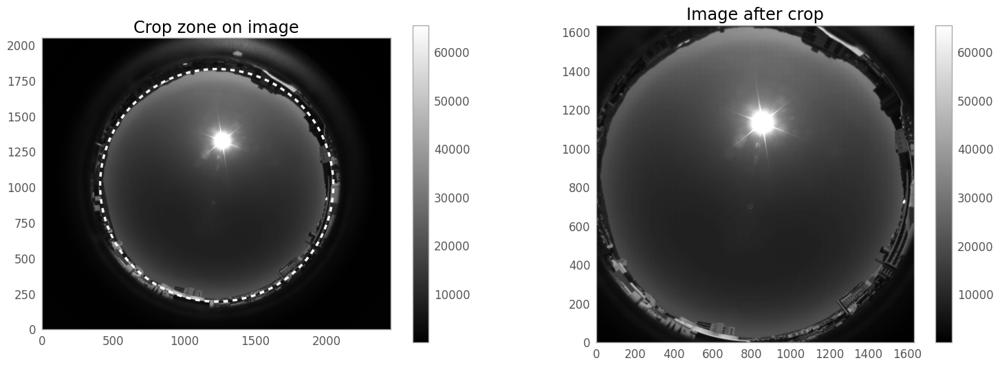

In [9]:
plt.figure(figsize=(18,6))

plt.subplot(121)
image_tot_r=np.load(png_raw_name+str(i_eme_image)+'.npy').astype('int64') #Enfin on charge l'image en question.
image_tot_r[np.where((theta_big>limit_Zenith_Angle-np.pi*0.005) & (theta_big<limit_Zenith_Angle+np.pi*0.005) & ((alpha_big%(np.pi/40)>(np.pi/80))))]=65520
plt.imshow(image_tot_r,cmap='gray',origin='lower')
plt.colorbar()
plt.grid(False)
plt.title("Crop zone on image")
plt.subplot(122)
#image[theta>limit_Zenith_Angle]=0
plt.imshow(image,cmap='gray',origin='lower')#<65520)
plt.grid(False)
plt.colorbar()
plt.title("Image after crop")

Corresponding orientations in ENU frame for reduced images

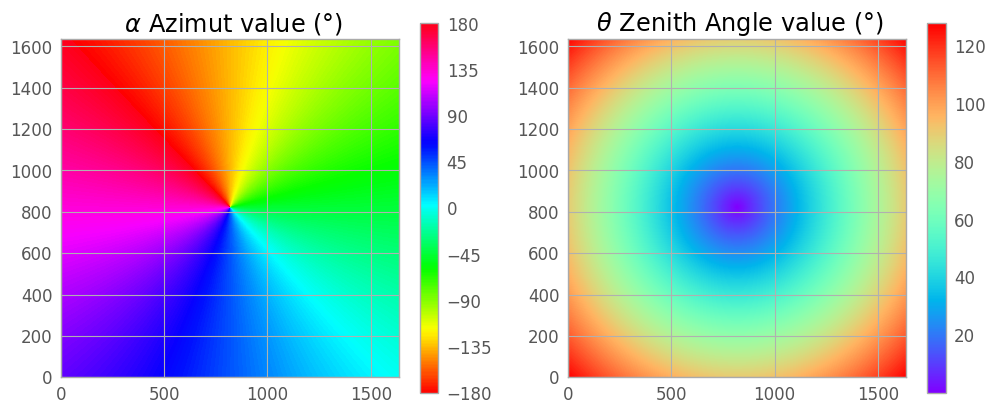

In [10]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.title(r" $\alpha$ Azimut value (°)")

plt.imshow(alpha*180/np.pi,cmap='hsv',interpolation = 'none', origin='lower' )
cbar=plt.colorbar(boundaries=np.linspace(-180,180,361),ticks=[-180,-135,-90,-45,0,45,90,135,180],shrink=0.4)

plt.subplot(122)
plt.title(r" $\theta$ Zenith Angle value (°)")

plt.imshow(theta*180/np.pi,cmap='rainbow',interpolation = 'none', origin='lower')
cbar=plt.colorbar(shrink=0.4)#boundaries=np.linspace(-180,180,361),ticks=[-180,-135,-90,-45,0,45,90,135,180])

plt.show()

In [11]:
eph=ephemeride.ephemerides() #Initialization of the class used to calculate ephemerides.

In [12]:
sorted_filenames_dict = {}

# Populate the dictionary with the sorted filenames
for filename in dirs_files:
    key = filename.split('T')[0]
    if key not in sorted_filenames_dict:
        sorted_filenames_dict[key] = []
    sorted_filenames_dict[key].append(filename)

##### Images are 12 bits encoded with a 4 bits shift

In [13]:
image.dtype

dtype('uint16')

In [14]:
print(image_tot.min())
print(image_tot.max())

16
65520


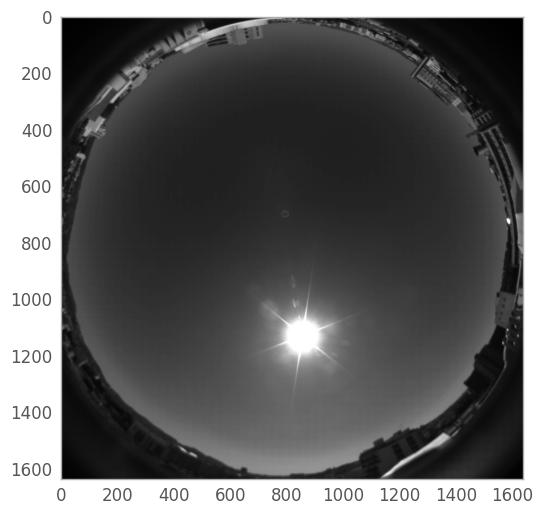

In [15]:
plt.imshow(image,cmap='grey')
plt.grid(False)

### Function that process image

In [16]:
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

def process_acq(chemins_pos):
    chemins=np.load(path+chemins_pos)
    i=0
    liste=[]
    for chemin in chemins:
        liste.append(process_image(chemin,i))
        i+=1
    return liste

def process_image(chemin,i_eme_image):
    #faire une boucle for sur chemins !
    png_raw_name=path+chemin.split('ManipeResultats/')[1] #Reconstruct the path of each image by keeping only the end 
    #of the path and adapting it to the system where the processing is done.
    liste_expo=np.load(png_raw_name+"liste_expo"+'.npy') # Loading exposure times associated with images
    config_monture=np.load(png_raw_name+"config_monture.npy")

    (Psi_sun,Theta_sun)=eph.getAltAzSoleil(chemin.split('ManipeResultats/')[1]) # Ephemerids
    (Ha_sun,Dec_sun)=eph.getHADecSoleil(chemin.split('ManipeResultats/')[1]) 
    chainetps=chemin.split('ManipeResultats/')[1]
    chaineheure=chainetps.split("T")[1][0:-1].split("-")

    chainedate=chainetps.split('T')[0]

    heure_image=ephemeride.Time(chainetps.split("T")[0]+'T'+chaineheure[0]+":"+chaineheure[1]+":"+chaineheure[2])

    if int(chaineheure[0])<6 or int(chaineheure[0])>21: # Keeping only images that are over the day and do not include the most of the ones by night.
        #print("continue : hours out of range : "+str(chaineheure))
        return None

    image_tot=np.load(png_raw_name+str(i_eme_image)+'.npy').astype('int64') # Loading image

    image=image_tot[crop_x_min:crop_x_max,crop_y_min:crop_y_max].astype('uint16')

    #image[theta>limit_Zenith_Angle]=0

    degre_sat=np.count_nonzero(image>=65520)/(image.shape[0]*image.shape[1])

    if degre_sat>0.2:
    #    print("saturation :",degre_sat)
        return None#continue


    sortie=np.array([image,liste_expo[i_eme_image],chainetps[:-1],i_eme_image])
    return sortie

# Processing of images
As we are using multiprocessing python package, please ajust "num_processes" variables to the number of CPU cores on your computer

In [17]:
for key in sorted_filenames_dict:
    print(key)
    tic=time.time()
    liste_jour=sorted_filenames_dict[key]
    num_processes=32*2
    results = (p_map(process_acq ,liste_jour,num_cpus=num_processes,tqdm=tqdm)) #[15000:15500:10]
    results = np.array([sublist for sublists in results for sublist in sublists if sublist is not None])
    np.save(out_path+key+"_raw.npy",results)
    print("Elapsed Time : ",time.time()-tic)


2022-07-29


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 76/76 [00:26<00:00,  2.89it/s]


Elapsed Time :  31.58906602859497
2022-07-30


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 134/134 [00:25<00:00,  5.17it/s]


Elapsed Time :  37.446167945861816
2022-07-31


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:28<00:00,  4.80it/s]


Elapsed Time :  43.12157583236694
2022-08-01


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 128/128 [00:21<00:00,  5.83it/s]


Elapsed Time :  38.777403831481934
2022-08-02


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 136/136 [00:28<00:00,  4.69it/s]


Elapsed Time :  46.45157313346863
2022-08-03


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 133/133 [00:23<00:00,  5.69it/s]


Elapsed Time :  45.6088764667511
2022-08-04


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:26<00:00,  5.29it/s]


Elapsed Time :  47.42524075508118
2022-08-05


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:33<00:00,  4.17it/s]


Elapsed Time :  53.70567297935486
2022-08-06


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 140/140 [00:31<00:00,  4.43it/s]


Elapsed Time :  52.11166524887085
2022-08-07


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:29<00:00,  4.62it/s]


Elapsed Time :  49.05167508125305
2022-08-08


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:30<00:00,  4.50it/s]


Elapsed Time :  51.59292936325073
2022-08-09


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:24<00:00,  5.64it/s]


Elapsed Time :  47.069310903549194
2022-08-10


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 142/142 [00:23<00:00,  6.04it/s]


Elapsed Time :  45.91825985908508
2022-08-11


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:26<00:00,  5.18it/s]


Elapsed Time :  49.71386504173279
2022-08-12


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:25<00:00,  5.39it/s]


Elapsed Time :  46.608689069747925
2022-08-13


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:34<00:00,  4.05it/s]


Elapsed Time :  53.662256717681885
2022-08-14


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:33<00:00,  4.22it/s]


Elapsed Time :  65.06866526603699
2022-08-15


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 142/142 [00:29<00:00,  4.79it/s]


Elapsed Time :  51.23765778541565
2022-08-16


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 136/136 [00:30<00:00,  4.49it/s]


Elapsed Time :  51.95553994178772
2022-08-17


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:33<00:00,  4.19it/s]


Elapsed Time :  58.42147421836853
2022-08-18


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:32<00:00,  4.32it/s]


Elapsed Time :  55.687376499176025
2022-08-19


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:38<00:00,  3.57it/s]


Elapsed Time :  62.395238161087036
2022-08-20


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:53<00:00,  2.64it/s]


Elapsed Time :  85.80643677711487
2022-08-21


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:43<00:00,  3.20it/s]


Elapsed Time :  65.95848202705383
2022-08-22


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:27<00:00,  5.04it/s]


Elapsed Time :  51.34992456436157
2022-08-23


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:34<00:00,  4.08it/s]


Elapsed Time :  57.42958950996399
2022-08-24


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:34<00:00,  4.01it/s]


Elapsed Time :  57.55159020423889
2022-08-25


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:38<00:00,  3.53it/s]


Elapsed Time :  65.24938583374023
2022-08-26


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 134/134 [00:25<00:00,  5.30it/s]


Elapsed Time :  50.09098553657532
2022-08-27


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 135/135 [00:28<00:00,  4.79it/s]


Elapsed Time :  50.2341103553772
2022-08-28


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 134/134 [00:27<00:00,  4.88it/s]


Elapsed Time :  62.87533640861511
2022-08-29


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  6.81it/s]


Elapsed Time :  22.101261854171753


### Show RGB animation of images a choosen day with a choosen exposure type to check processing went well

In [18]:
image_type=7
res=np.load(out_path+"2022-08-15"+"_raw.npy",allow_pickle=True)
video = res[res[:,3]==image_type,0]

In [19]:
# corresponding exposures :
print(res[res[:,3]==image_type,1])

[506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88 506.88
 506.88 506.88 506.88 506.88]


In [20]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

fig, ax = plt.subplots()  # Create a subplot and get the Axes object
image=video[0].astype('float32')

def imageRGB_proc(image):
    a=rebin(image,(image.shape[0]//2,image.shape[1]//2))
#imageRGB=(cv2.merge((a[0::2,1::2],0.5*(a[0::2,1::2]+a[1::2,0::2]),a[1::2,1::2]))/65520.0*255).astype('uint8')
#imageRGB = (np.stack([a[0::2,0::2],0.5*(a[0::2,1::2]+a[1::2,0::2]),a[1::2,1::2]], axis=2)/65520.0*255).astype('uint8')
    imageRGB = (np.stack([a[0::2, 0::2], 0.5 * (a[0::2, 1::2] + a[1::2, 0::2]), a[1::2, 1::2]], axis=2) / 65520.0).astype('float32') * 255
    imageRGB=imageRGB.astype('uint8')
    return imageRGB
imageRGB=imageRGB_proc(image)

im = ax.imshow(imageRGB)

ax.set_aspect('equal')

ax.invert_yaxis()  # Invert the y-axis for the Axes object

plt.grid(False)

plt.close() # this is required to not display the generated image

def init():
    imageRGB=imageRGB_proc(video[0])
    im.set_data(imageRGB)

def animate(i):
    imageRGB=imageRGB_proc(video[i])
    im.set_data(imageRGB)
    #im.set_data(video[i])
    return im

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=video.shape[0],
                               interval=50)
#HTML(anim.to_html5_video())
display(HTML(anim.to_jshtml()))